In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
# from torch.utils.data import Dataset, DataLoader
# import torch
# import random

from tqdm import tqdm
import pandas as pd
import netCDF4 as nc

# This is just until temporary implementation
import os 
import sys
cwd = os.getcwd()
sys.path.insert(0,cwd + '/../timetransformers')

from data_handling import TimeSeriesDataset, download_data
from utils import convert_df_to_numpy, convert_tsf_to_dataframe

%matplotlib inline
%config InlineBackend.figure_format='retina'

In [2]:
sub_sample_rate_sea = 3
sub_sample_rate_other = 1

# Sea Temperature

Data downloaded from https://downloads.psl.noaa.gov/Datasets/noaa.oisst.v2.highres/

## Daily Means

In [3]:
years = ["1985", "1990", "1995", "2001", "2005", "2010", "2015", "2021"]

sst_mean_time_series = []

for year in years:
    dataset = nc.Dataset(f"../data/NOA_data/sst.day.mean.{year}.nc")
    coords_already_visited = set()

    variable = dataset.variables["sst"][:]
    max_long = dataset.variables["lon"][:].shape[0]
    max_lat = dataset.variables["lat"][:].shape[0]

    for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
        for j in range(0, max_lat, sub_sample_rate_sea):
            rand_i = np.random.randint(0, max_long)
            rand_j = np.random.randint(0, max_lat)
            current_data = variable[:, rand_j, rand_i]
            if np.isnan(current_data).any() or current_data.mask.any():
                continue
            else:
                if (rand_i, rand_j) in coords_already_visited:
                    continue
                coords_already_visited.add((rand_i, rand_j))
                sst_mean_time_series.append(current_data.data)

sst_mean_time_series = np.array(sst_mean_time_series)
print(sst_mean_time_series.size / 1e6)

100%|██████████| 480/480 [00:03<00:00, 134.29it/s]


212.39131


In [4]:
print(sst_mean_time_series.shape)

(581894, 365)


100%|██████████| 117/117 [00:00<00:00, 2683.98it/s]


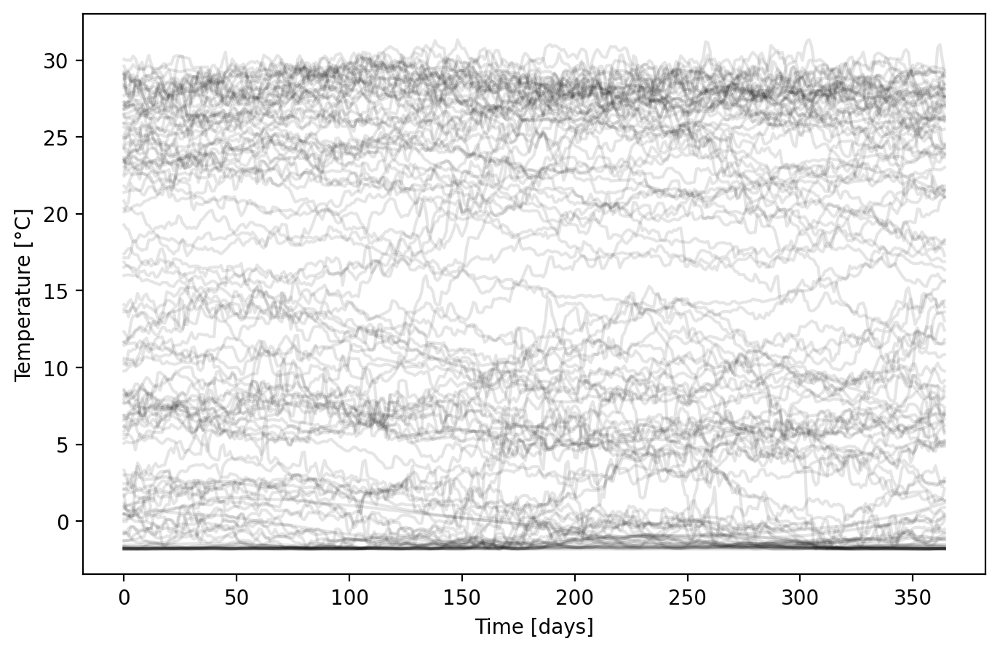

In [5]:
plt.figure(figsize=(8, 5))
for i in tqdm(range(0, sst_mean_time_series.shape[0], 5000)):
    plt.plot(sst_mean_time_series[i], alpha=0.1, color="k")

plt.xlabel("Time [days]")
plt.ylabel("Temperature [°C]")
plt.show()

### Daily Anomalies

In [6]:
years = ["1985", "1990", "1995", "2001", "2005", "2010", "2015", "2021"]

sst_anom_time_series = []

for year in years:
    dataset = nc.Dataset(f"../data/NOA_data/sst.day.anom.{year}.nc")
    coords_already_visited = set()

    variable = dataset.variables["anom"][:]
    max_long = dataset.variables["lon"][:].shape[0]
    max_lat = dataset.variables["lat"][:].shape[0]

    for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
        for j in range(0, max_lat, sub_sample_rate_sea):
            rand_i = np.random.randint(0, max_long)
            rand_j = np.random.randint(0, max_lat)
            current_data = variable[:, rand_j, rand_i]
            if np.isnan(current_data).any() or current_data.mask.any():
                continue
            else:
                if (rand_i, rand_j) in coords_already_visited:
                    continue
                coords_already_visited.add((rand_i, rand_j))
                sst_anom_time_series.append(current_data.data)

sst_anom_time_series = np.array(sst_anom_time_series)
print(sst_anom_time_series.size / 1e6)

100%|██████████| 480/480 [00:03<00:00, 132.41it/s]


212.51833


100%|██████████| 117/117 [00:00<00:00, 4463.41it/s]


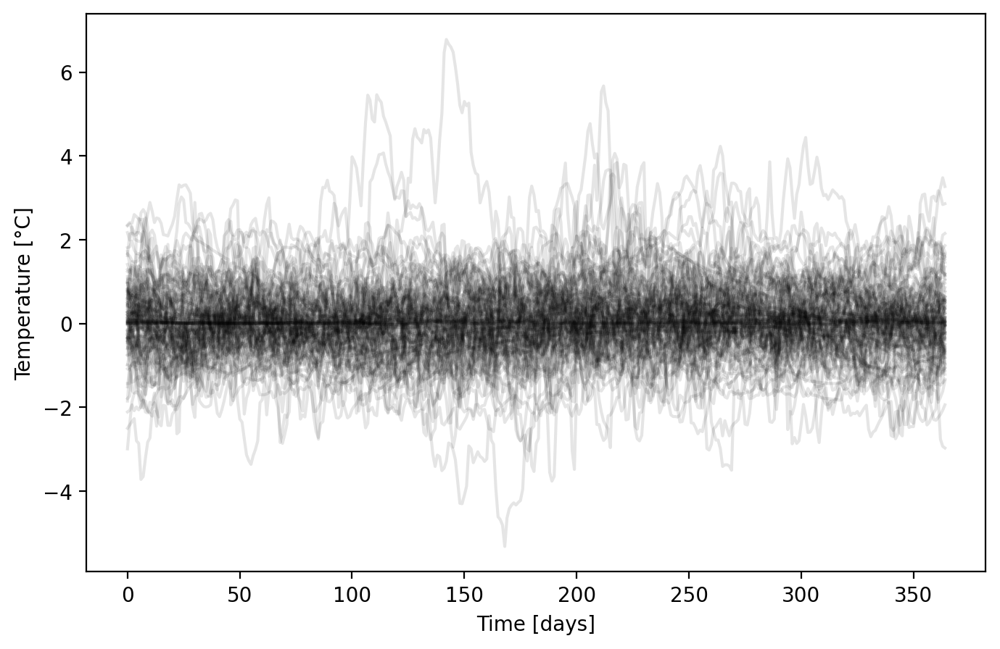

In [7]:
plt.figure(figsize=(8, 5))
for i in tqdm(range(0, sst_anom_time_series.shape[0], 5000)):
    plt.plot(sst_anom_time_series[i], alpha=0.1, color="k")

plt.xlabel("Time [days]")
plt.ylabel("Temperature [°C]")
plt.show()

### Long Term Trends

In [8]:
ltm_sst_1971_2000 = nc.Dataset(f"../data/NOA_data/sst.day.mean.ltm.1971-2000.nc")
ltm_sst_1982_2010 = nc.Dataset(f"../data/NOA_data/sst.day.mean.ltm.1982-2010.nc")
ltm_sst_1991_2020 = nc.Dataset(f"../data/NOA_data/sst.day.mean.ltm.1991-2020.nc")

sst_ltm_datasets = [ltm_sst_1971_2000, ltm_sst_1982_2010, ltm_sst_1991_2020]
sst_ltm_series = []

for ltm in sst_ltm_datasets:
    coords_already_visited = set()
    variable = ltm.variables["sst"][:]
    max_long = ltm.variables["lon"][:].shape[0]
    max_lat = ltm.variables["lat"][:].shape[0]

    for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
        for j in range(0, max_lat, sub_sample_rate_sea):
            rand_i = np.random.randint(0, max_long)
            rand_j = np.random.randint(0, max_lat)
            current_data = variable[:, rand_j, rand_i]
            if np.isnan(current_data).any() or current_data.mask.any():
                continue
            else:
                if (rand_i, rand_j) in coords_already_visited:
                    continue
                coords_already_visited.add((rand_i, rand_j))
                sst_ltm_series.append(current_data.data)

sst_ltm_series = np.array(sst_ltm_series)
print(sst_ltm_series.size / 1e6)

100%|██████████| 480/480 [00:03<00:00, 134.73it/s]


79.55759


100%|██████████| 2180/2180 [00:00<00:00, 5332.13it/s]


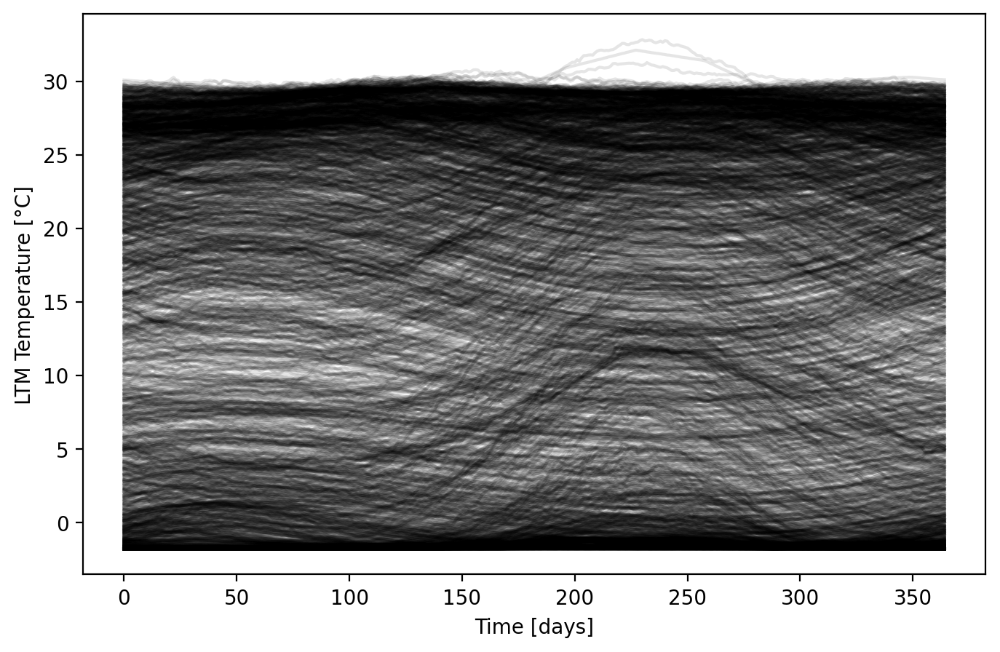

In [9]:
plt.figure(figsize=(8, 5))
for i in tqdm(range(0, sst_ltm_series.shape[0], 100)):
    plt.plot(sst_ltm_series[i], alpha=0.1, color="k")

plt.xlabel("Time [days]")
plt.ylabel("LTM Temperature [°C]")
plt.show()

In [10]:
sst_mon_mean = nc.Dataset(f"../data/NOA_data/sst.mon.mean.nc")
sst_mon_series = []

coords_already_visited = set()
variable = sst_mon_mean.variables["sst"][:]
max_long = sst_mon_mean.variables["lon"][:].shape[0]
max_lat = sst_mon_mean.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
    for j in range(0, max_lat, sub_sample_rate_sea):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if np.isnan(current_data).any() or current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            sst_mon_series.append(current_data.data)

sst_mon_series = np.array(sst_mon_series)
print(sst_mon_series.size / 1e6)

100%|██████████| 480/480 [00:03<00:00, 124.73it/s]


37.022115


100%|██████████| 73/73 [00:00<00:00, 3861.38it/s]


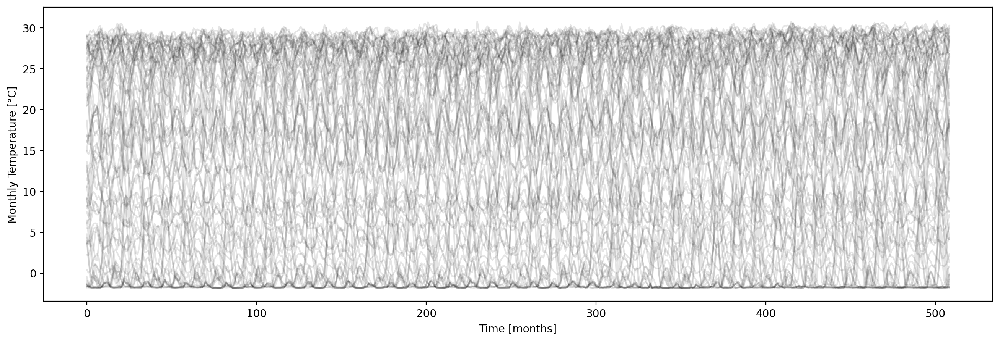

In [11]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, sst_mon_series.shape[0], 1000)):
    plt.plot(sst_mon_series[i], alpha=0.1, color="k")

plt.xlabel("Time [months]")
plt.ylabel("Monthly Temperature [°C]")
plt.show()

In [12]:
sst_week_mean = nc.Dataset(f"../data/NOA_data/sst.week.mean.nc")
sst_week_series = []

coords_already_visited = set()
variable = sst_week_mean.variables["sst"][:]
max_long = sst_week_mean.variables["lon"][:].shape[0]
max_lat = sst_week_mean.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
    for j in range(0, max_lat, sub_sample_rate_sea):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if np.isnan(current_data).any() or current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            sst_week_series.append(current_data.data)

sst_week_series = np.array(sst_week_series)
print(sst_week_series.size / 1e6)

100%|██████████| 480/480 [00:08<00:00, 54.79it/s]


160.734186


100%|██████████| 73/73 [00:00<00:00, 3240.01it/s]


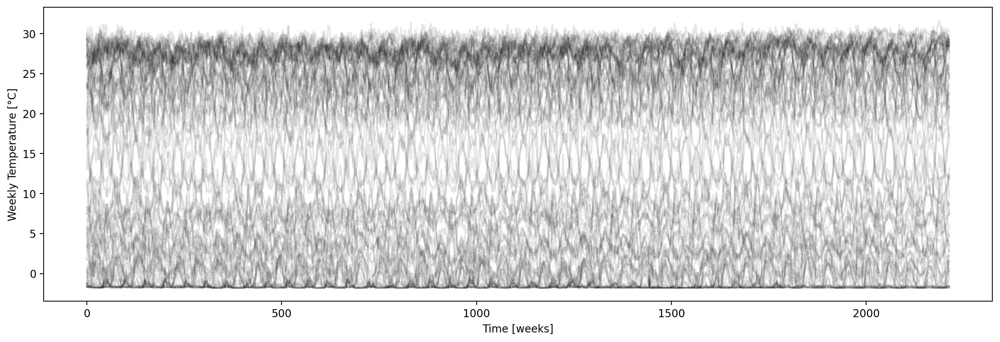

In [13]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, sst_week_series.shape[0], 1000)):
    plt.plot(sst_week_series[i], alpha=0.1, color="k")

plt.xlabel("Time [weeks]")
plt.ylabel("Weekly Temperature [°C]")
plt.show()

# Sea Ice

### Daily Means

In [14]:
years = ["1985", "1990", "1995", "2001", "2005", "2010", "2015", "2021"]

ice_mean_time_series = []

for year in years:
    dataset = nc.Dataset(f"../data/NOA_data/icec.day.mean.{year}.nc")
    coords_already_visited = set()

    variable = dataset.variables["icec"][:]
    max_long = dataset.variables["lon"][:].shape[0]
    max_lat = dataset.variables["lat"][:].shape[0]

    for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
        for j in range(0, max_lat, sub_sample_rate_sea):
            rand_i = np.random.randint(0, max_long)
            rand_j = np.random.randint(0, max_lat)
            current_data = variable[:, rand_j, rand_i]
            if np.isnan(current_data).any() or current_data.mask.any():
                continue
            else:
                if (rand_i, rand_j) in coords_already_visited:
                    continue
                coords_already_visited.add((rand_i, rand_j))
                ice_mean_time_series.append(current_data.data)

ice_mean_time_series = np.array(ice_mean_time_series)
print(ice_mean_time_series.size / 1e6)

100%|██████████| 480/480 [00:03<00:00, 133.98it/s]


23.336275


In [15]:
print(ice_mean_time_series.shape)

(63935, 365)


100%|██████████| 640/640 [00:00<00:00, 5763.84it/s]


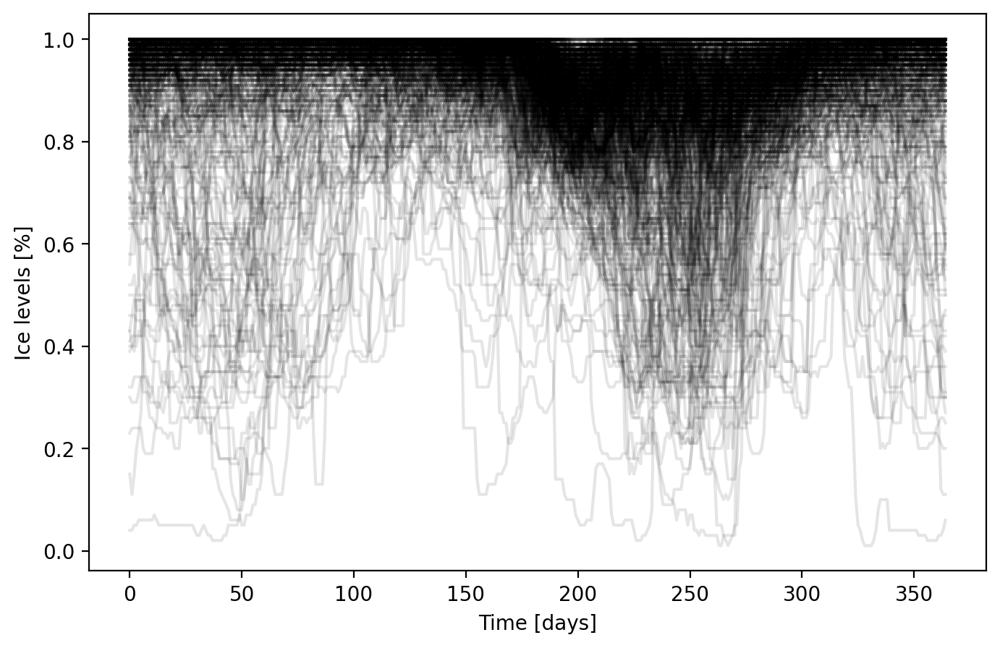

In [16]:
plt.figure(figsize=(8, 5))
for i in tqdm(range(0, ice_mean_time_series.shape[0], 100)):
    plt.plot(ice_mean_time_series[i], alpha=0.1, color="k")

plt.xlabel("Time [days]")
plt.ylabel("Ice levels [%]")
plt.show()

### Long Term Trends

In [17]:
ltm_icec_1991_2020 = nc.Dataset(f"../data/NOA_data/icec.day.mean.ltm.1991-2020.nc")

ice_ltm_series = []

coords_already_visited = set()
variable = ltm_icec_1991_2020.variables["icec"][:]
max_long = ltm_icec_1991_2020.variables["lon"][:].shape[0]
max_lat = ltm_icec_1991_2020.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
    for j in range(0, max_lat, sub_sample_rate_sea):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if np.isnan(current_data).any() or current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            ice_ltm_series.append(current_data.data)

ice_ltm_series = np.array(ice_ltm_series)
print(ice_ltm_series.size / 1e6)

100%|██████████| 480/480 [00:03<00:00, 132.62it/s]

4.479645


100%|██████████| 123/123 [00:00<00:00, 4212.04it/s]


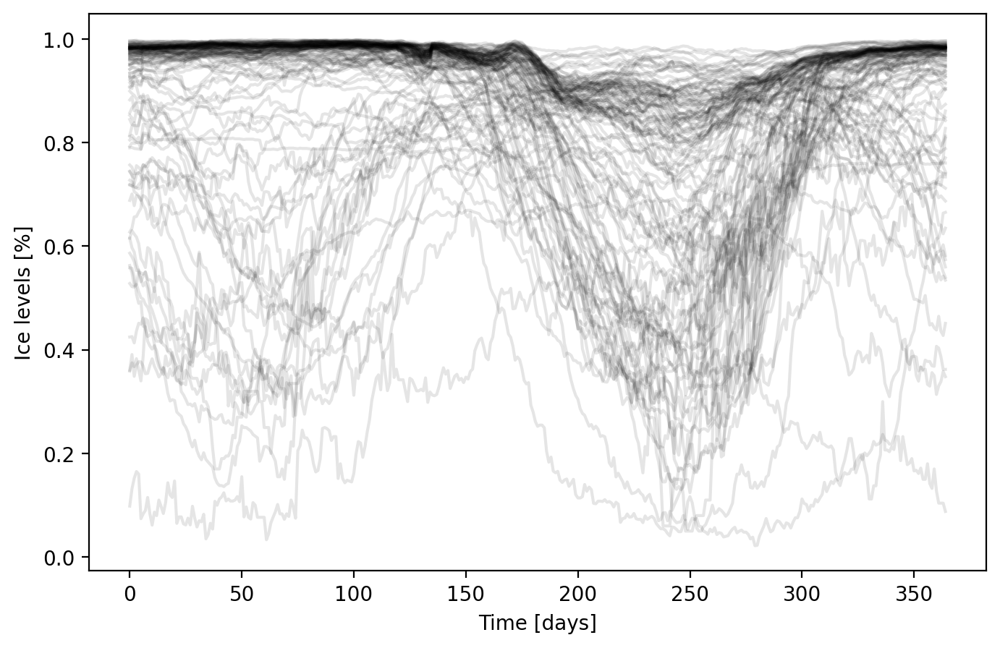

In [18]:
plt.figure(figsize=(8, 5))
for i in tqdm(range(0, ice_ltm_series.shape[0], 100)):
    plt.plot(ice_ltm_series[i], alpha=0.1, color="k")

plt.xlabel("Time [days]")
plt.ylabel("Ice levels [%]")
plt.show()

In [19]:
ice_mon_mean = nc.Dataset(f"../data/NOA_data/icec.mon.mean.nc")
ice_mon_series = []

coords_already_visited = set()
variable = ice_mon_mean.variables["icec"][:]
max_long = ice_mon_mean.variables["lon"][:].shape[0]
max_lat = ice_mon_mean.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
    for j in range(0, max_lat, sub_sample_rate_sea):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if np.isnan(current_data).any() or current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            ice_mon_series.append(current_data.data)

ice_mon_series = np.array(ice_mon_series)
print(ice_mon_series.size / 1e6)

100%|██████████| 480/480 [00:03<00:00, 123.33it/s]

2.719078


100%|██████████| 54/54 [00:00<00:00, 3264.85it/s]


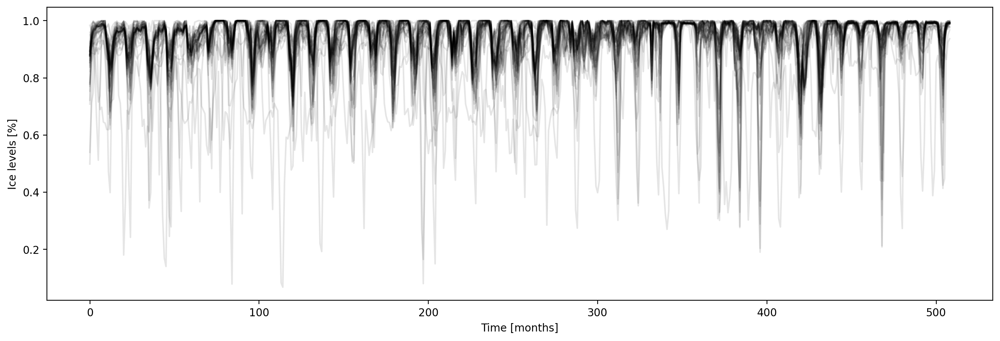

In [20]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, ice_mon_series.shape[0], 100)):
    plt.plot(ice_mon_series[i], alpha=0.1, color="k")

plt.xlabel("Time [months]")
plt.ylabel("Ice levels [%]")
plt.show()

In [21]:
icec_week_mean = nc.Dataset(f"../data/NOA_data/icec.week.mean.nc")
icec_week_series = []

coords_already_visited = set()
variable = icec_week_mean.variables["icec"][:]
max_long = icec_week_mean.variables["lon"][:].shape[0]
max_lat = icec_week_mean.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_sea)):
    for j in range(0, max_lat, sub_sample_rate_sea):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if np.isnan(current_data).any() or current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            icec_week_series.append(current_data.data)

icec_week_series = np.array(icec_week_series)
print(icec_week_series.size / 1e6)

100%|██████████| 480/480 [00:08<00:00, 55.26it/s]

0.0


0it [00:00, ?it/s]


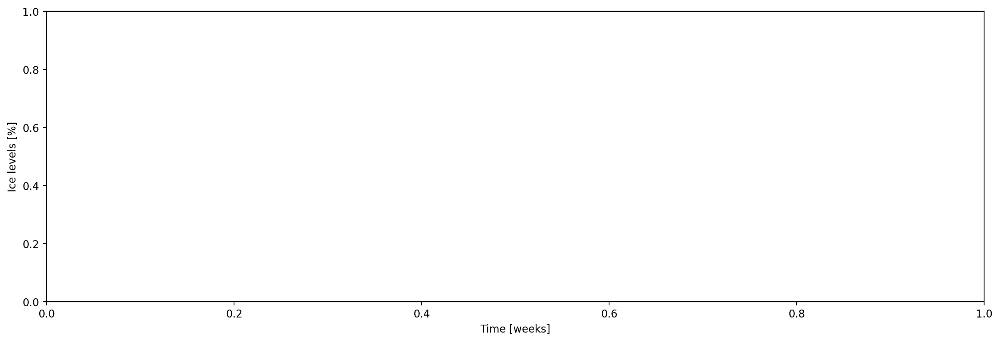

In [22]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, icec_week_series.shape[0], 1000)):
    plt.plot(icec_week_series[i], alpha=0.1, color="k")

plt.xlabel("Time [weeks]")
plt.ylabel("Ice levels [%]")
plt.show()

Weekly ice dataset is empty

# Precipitation

Downloaded from https://downloads.psl.noaa.gov/Datasets/cmap/enh/

In [23]:
precip_mon_ltm = nc.Dataset(f"../data/NOA_data/precip.mon.ltm.nc")
precip_mon_ltm_series = []

coords_already_visited = set()
variable = precip_mon_ltm.variables["precip"][:]
max_long = precip_mon_ltm.variables["lon"][:].shape[0]
max_lat = precip_mon_ltm.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_other)):
    for j in range(0, max_lat, sub_sample_rate_other):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            precip_mon_ltm_series.append(current_data.data)

precip_mon_ltm_series = np.array(precip_mon_ltm_series)
print(precip_mon_ltm_series.size / 1e6)

100%|██████████| 144/144 [00:00<00:00, 632.36it/s]

0.078816


100%|██████████| 657/657 [00:00<00:00, 2521.00it/s]


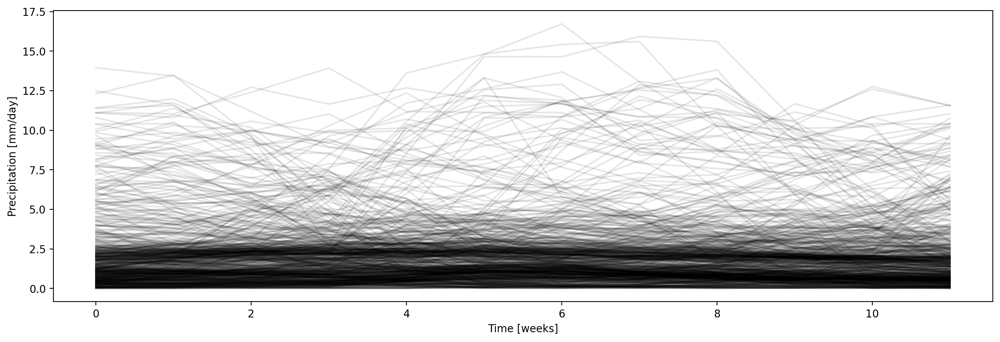

In [24]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, precip_mon_ltm_series.shape[0], 10)):
    plt.plot(precip_mon_ltm_series[i], alpha=0.1, color="k")

plt.xlabel("Time [weeks]")
plt.ylabel("Precipitation [mm/day]")
plt.show()

In [25]:
precip_mon_mean = nc.Dataset(f"../data/NOA_data/precip.mon.mean.nc")
precip_mon_mean_series = []

coords_already_visited = set()
variable = precip_mon_mean.variables["precip"][:]
max_long = precip_mon_mean.variables["lon"][:].shape[0]
max_lat = precip_mon_mean.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_other)):
    for j in range(0, max_lat, sub_sample_rate_other):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            precip_mon_mean_series.append(current_data.data)

precip_mon_mean_series = np.array(precip_mon_mean_series)
print(precip_mon_mean_series.size / 1e6)

100%|██████████| 144/144 [00:00<00:00, 1703.76it/s]

3.55437


100%|██████████| 657/657 [00:00<00:00, 4781.52it/s]


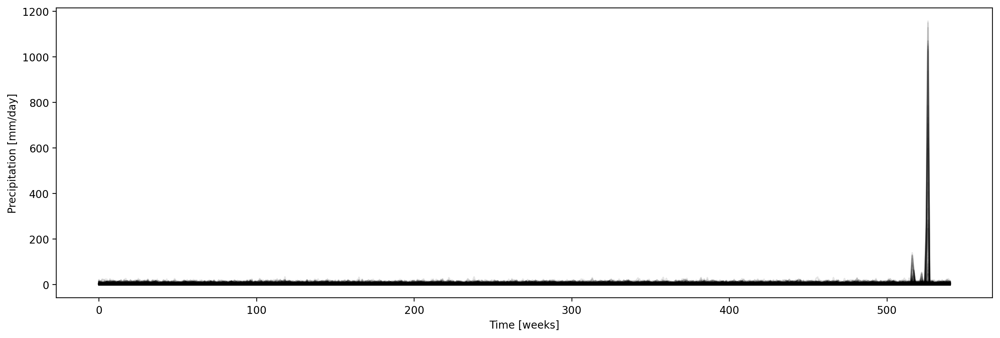

In [26]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, precip_mon_mean_series.shape[0], 10)):
    plt.plot(precip_mon_mean_series[i], alpha=0.1, color="k")

plt.xlabel("Time [weeks]")
plt.ylabel("Precipitation [mm/day]")
plt.show()

In [27]:
precip_pentad_mean = nc.Dataset(f"../data/NOA_data/precip.pentad.mean.nc")
precip_pentad_mean_series = []

coords_already_visited = set()
variable = precip_pentad_mean.variables["precip"][:]
max_long = precip_pentad_mean.variables["lon"][:].shape[0]
max_lat = precip_pentad_mean.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, 2)):
    for j in range(0, max_lat, sub_sample_rate_other):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            precip_pentad_mean_series.append(current_data.data)

precip_pentad_mean_series = np.array(precip_pentad_mean_series)
print(precip_pentad_mean_series.size / 1e6)

100%|██████████| 72/72 [00:00<00:00, 1691.13it/s]

11.320694


100%|██████████| 41/41 [00:00<00:00, 1478.54it/s]


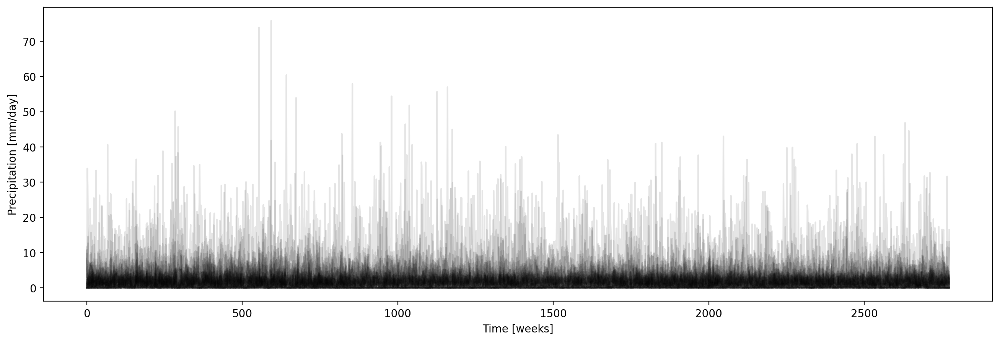

In [28]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, precip_pentad_mean_series.shape[0], 100)):
    plt.plot(precip_pentad_mean_series[i], alpha=0.1, color="k")

plt.xlabel("Time [weeks]")
plt.ylabel("Precipitation [mm/day]")
plt.show()

# Radiation

Downloaded from https://downloads.psl.noaa.gov/Datasets/uninterp_OLR/

In [29]:
olr_daily_ltm = nc.Dataset(f"../data/NOA_data/olr.daily.ltm.1979-1995.nc")
olr_daily_ltm_series = []

coords_already_visited = set()
variable = olr_daily_ltm.variables["olr"][:]
max_long = olr_daily_ltm.variables["lon"][:].shape[0]
max_lat = olr_daily_ltm.variables["lat"][:].shape[0]

for i in tqdm(range(0, max_long, sub_sample_rate_other)):
    for j in range(0, max_lat, sub_sample_rate_other):
        rand_i = np.random.randint(0, max_long)
        rand_j = np.random.randint(0, max_lat)
        current_data = variable[:, rand_j, rand_i]
        if current_data.mask.any():
            continue
        else:
            if (rand_i, rand_j) in coords_already_visited:
                continue
            coords_already_visited.add((rand_i, rand_j))
            olr_daily_ltm_series.append(current_data.data)

olr_daily_ltm_series = np.array(olr_daily_ltm_series)
print(olr_daily_ltm_series.size / 1e6)

100%|██████████| 144/144 [00:00<00:00, 1517.18it/s]

2.407905


100%|██████████| 660/660 [00:00<00:00, 2702.93it/s]


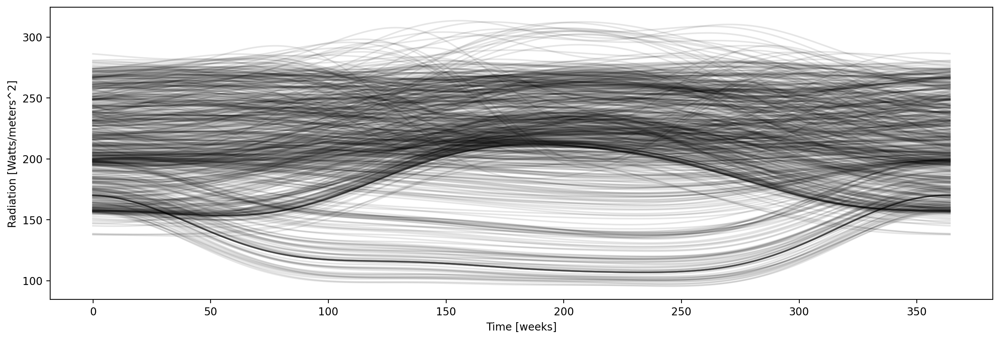

In [30]:
plt.figure(figsize=(16, 5))
for i in tqdm(range(0, olr_daily_ltm_series.shape[0], 10)):
    plt.plot(olr_daily_ltm_series[i], alpha=0.1, color="k")

plt.xlabel("Time [weeks]")
plt.ylabel("Radiation [Watts/meters^2]")
plt.show()

# Total Dataset

In [31]:
print(sst_mean_time_series.size / 1e6)
print(sst_anom_time_series.size / 1e6)
print(sst_ltm_series.size / 1e6)
print(sst_mon_series.size / 1e6)
print(sst_week_series.size / 1e6)

print(ice_mean_time_series.size / 1e6)
print(ice_ltm_series.size / 1e6)
print(ice_mon_series.size / 1e6)

print(precip_mon_ltm_series.size / 1e6)
print(precip_mon_mean_series.size / 1e6)
print(precip_pentad_mean_series.size / 1e6)

print(olr_daily_ltm_series.size / 1e6)

212.39131
212.51833
79.55759
37.022115
160.734186
23.336275
4.479645
2.719078
0.078816
3.55437
11.320694
2.407905


In [35]:
print(
    (
        sst_mean_time_series.size
        + sst_anom_time_series.size
        + sst_ltm_series.size
        + sst_mon_series.size
        + sst_week_series.size
        + ice_mean_time_series.size
        + ice_ltm_series.size
        + ice_mon_series.size
        # + precip_mon_ltm_series.size
        # + precip_mon_mean_series.size
        # + precip_pentad_mean_series.size
        + olr_daily_ltm_series.size
    )
    / 1e6
)

735.166434


In [33]:
np.savez(
    "../data/NOA_data/weather.npz",
    sst_mean_time_series=sst_mean_time_series,
    sst_anom_time_series=sst_anom_time_series,
    sst_ltm_series=sst_ltm_series,
    sst_mon_series=sst_mon_series,
    sst_week_series=sst_week_series,
    ice_mean_time_series=ice_mean_time_series,
    ice_ltm_series=ice_ltm_series,
    ice_mon_series=ice_mon_series,
    olr_daily_ltm_series=olr_daily_ltm_series,
)

In [36]:
# Precipitation data is quite spikey and has a huge outlier
# precip_mon_ltm_series=precip_mon_ltm_series,
# precip_mon_mean_series=precip_mon_mean_series,
# precip_pentad_mean_series=precip_pentad_mean_series,

In [37]:
data = np.load("../data/NOA_data/weather.npz")